In [9]:
import scanpy as sc
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scFunctions as sf
import pickle
import os
import anndata


# Inital setting for plot size
from matplotlib import rcParams
FIGSIZE=(5,5)
rcParams['figure.figsize']=FIGSIZE

import warnings
warnings.filterwarnings('ignore')

sc.settings.verbosity = 3


%config Completer.use_jedi = False

# Import et autres trucs

In [10]:
with open('../data/adata_epi_last.pickle', 'rb') as f1:
     adata_epi = pickle.load(f1)

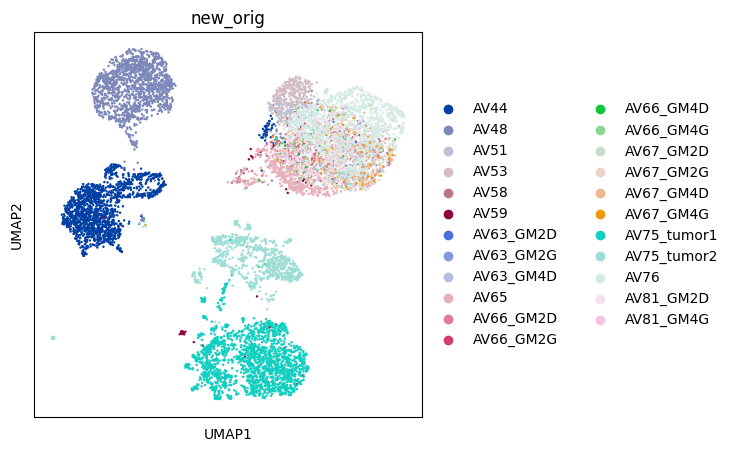

In [14]:
sc.pl.umap(adata_epi, color = "new_orig")

In [4]:
BASEFOLDER_NAME = "../data/SCENIC/"

MOTIFS_MGI_FNAME = os.path.join(BASEFOLDER_NAME, 'motifs-v9-nr.mgi-m0.001-o0.0.tbl')
OUT_TFS_MGI_FNAME = os.path.join(BASEFOLDER_NAME, 'mm_mgi_tfs.txt')

In [5]:
df_motifs_mgi = pd.read_csv(MOTIFS_MGI_FNAME, sep='\t')
mm_tfs = df_motifs_mgi.gene_name.unique()
with open(OUT_TFS_MGI_FNAME, 'wt') as f:
    f.write('\n'.join(mm_tfs) + '\n')
len(mm_tfs)

1721

In [6]:
t=adata_epi.X
pd.DataFrame(data=t, index=adata_epi.obs_names, columns=adata_epi.var_names).to_csv('../data/SCENIC/adata_epi_matrix.csv')

In [7]:
adata_epi.X

array([[-0.6288095 , -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198],
       [-0.35302013, -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198],
       [-0.6288095 , -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198],
       ...,
       [-0.6288095 , -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198],
       [-0.6288095 , -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198],
       [-0.6288095 , -0.20018741, -0.15738995, ..., -0.15333301,
        -0.12960976, -0.14554198]], dtype=float32)

In [15]:
nGenesDetectedPerCell = np.sum(adata_epi.X>0, axis=1)
nGenesDetectedPerCell
percentiles = np.quantile(nGenesDetectedPerCell, [.01, .05, .10, .50, 1])

percentiles = pd.DataFrame(percentiles, index=[.01, .05, .10, .50, 1])
print(percentiles)

           0
0.01   109.0
0.05   171.1
0.10   236.0
0.50   508.0
1.00  1367.0


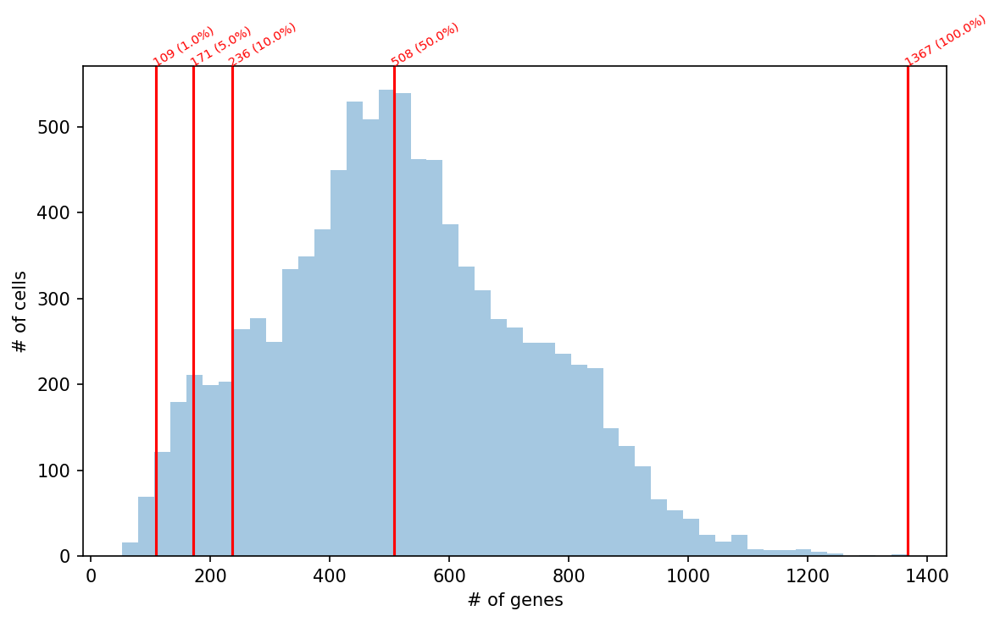

In [16]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i in range(5):
    x = percentiles.iloc[i, 0]
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({percentiles.index.values[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

In [109]:
import networkx as nx

In [20]:
df = pd.read_table("../data/SCENIC/adata_epi_adj.csv", sep = ',')

In [21]:
edges = []
weight = []
for i in df.index:
    edges.append((df.iloc[i, 0], df.iloc[i, 1]))
    weight.append(df.iloc[i,2])

In [22]:
edges[0:5]
weight[0:5]

[29.768319048872936,
 23.76475893760731,
 22.646077175623056,
 22.01824192427217,
 21.507625846122476]

In [23]:
FIGSIZE=(25,25)
rcParams['figure.figsize']=FIGSIZE
n = len(edges)
G = nx.DiGraph()
G.add_edges_from(edges[:n])
pos = nx.kamada_kawai_layout(G)
# nx.draw_networkx_nodes(G, pos, cmap=plt.get_cmap('jet'))
# nx.draw_networkx_labels(G, pos)
# nx.draw_networkx_edges(G, pos, edgelist=edges[:n], arrows=False, width = weight[:n]/max(weight[:n]))

plt.show()

NameError: name 'nx' is not defined

# Rajout des clusters CNV dans jeu de données

In [ ]:
"""
df = pd.read_table("../data/infercnv.observation_groupings.txt", sep = " ", index_col = 0)
df.shape
"""

In [ ]:
"""
cell_names = df.index
cell_names2 = adata_epi.obs.index

j = 0
for i in cell_names:
    if i not in cell_names2:
        j += 1

print(j)
# 56 cellules présentes chez margaux mais pas dans mon jeu de données


j = 0
for i in cell_names2:
    if i not in cell_names:
        j += 1

j

# 2376 cellules présentes chez moi mais pas dans le jeu de données de margaux
"""

In [ ]:
"""liste_keep = []

for i in cell_names2:
    if i in cell_names:
        liste_keep.append(True)
    else:
        liste_keep.append(False)

liste_keep[0:5]
"""

In [ ]:
"""
adata_epi.obs["has_cnv"] = liste_keep
"""

In [ ]:
"""
liste_cnv = [df.loc[i, "Dendrogram Group"] if i in df.index else "Healthy" for i in adata_epi.obs.index]
adata_epi.obs["cnv_group"] = liste_cnv
"""

In [ ]:
"""
sc.pl.umap(adata_epi, color = 'cnv_group')
"""

In [ ]:
"""
# Save adata without clusters
with open('../data/adata_epi_new_orig.pickle', 'wb') as f1:
    pickle.dump(adata_epi, f1)
"""

# Results de pyscenic

In [ ]:
df = pd.read_csv("../data/SCENIC/pyscenic_output.csv", index_col = 0)
df

In [ ]:
adata_epi.obs

In [50]:
liste_err = [i for i in df.index if i not in adata_epi.obs.index]
len(liste_err)

# On a bien toutes les cellules

0

In [139]:
# Essayer de faire une heat map de tous les TF en colonnes, les cellules en lignes et groupées par cnv group

In [140]:
# Rentrer les valeurs des TF dans l'object anndata et ensuite utiliser sc.pl.heatmap()

In [141]:
for column in df.columns:
    adata_epi.obs[column] = df[column]

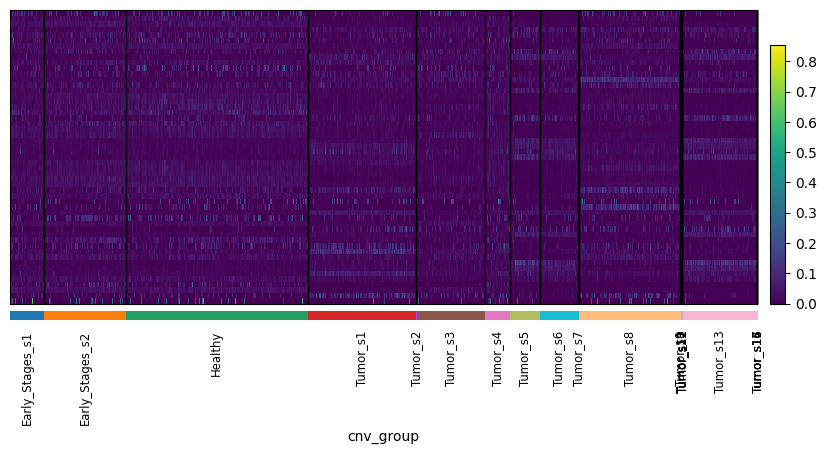

In [142]:
columns = df.columns
sc.pl.heatmap(adata_epi, groupby = "cnv_group", var_names=columns, swap_axes=True)

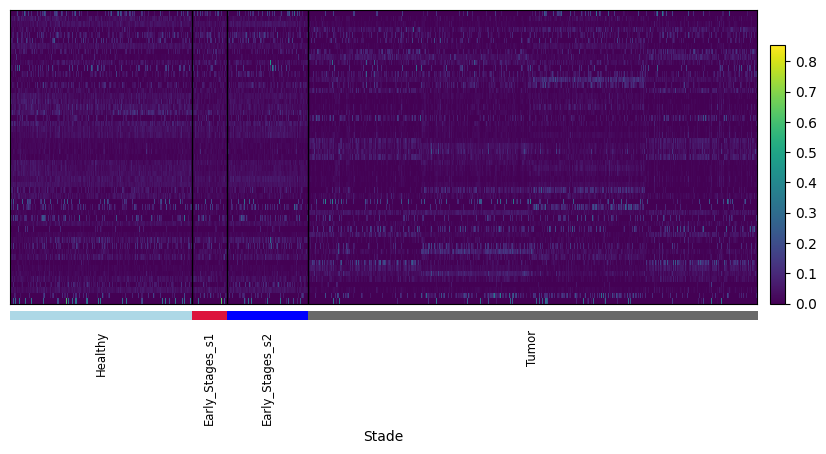

In [145]:
sc.pl.heatmap(adata_epi, groupby = "Stade", var_names=columns, swap_axes=True)

In [146]:
adata_epi

AnnData object with n_obs × n_vars = 9743 × 2569
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Experiment_ID', 'Stage', 'New_Cell_ID', 'Population', 'Mouse_ID', 'Week_post Cre_activation', 'Sub_class_Stage', 'Mammary_glands', 'mouse_age_(Week)', 'Stage_old', 'new_orig', 'has_cnv', 'cnv_group', 'Stade', 'Acaa1b(+)', 'Atf3(+)', 'Bach2(+)', 'Batf3(+)', 'Bcl6(+)', 'Bhlhe40(+)', 'Cebpd(+)', 'Dbp(+)', 'E2f1(+)', 'Ebf1(+)', 'Elf3(+)', 'Elk3(+)', 'Ets1(+)', 'Etv1(+)', 'Etv3(+)', 'Fos(+)', 'Fosb(+)', 'Fosl1(+)', 'Fosl2(+)', 'Foxa1(+)', 'Foxi1(+)', 'Foxo3(+)', 'Glis3(+)', 'Ikzf1(+)', 'Irf1(+)', 'Irf7(+)', 'Irf8(+)', 'Jun(+)', 'Junb(+)', 'Jund(+)', 'Klf12(+)', 'Klf4(+)', 'Mafb(+)', 'Maff(+)', 'Mxd1(+)', 'Mxd4(+)', 'Nfkb2(+)', 'Nr1d1(+)', 'Pdlim5(+)', 'Rbpj(+)', 'Relb(+)', 'Rfx3(+)', 'Runx1(+)', 'Sox4(+)', 'Sox5(+)', 'Sox8(+)', 'Spib(+)', 'Stat1(+)', 'Stat5a(+)', 'Tcf7l2(+)', 'Thrb(+)', 'Zfp12(+)', 'Zfp710(+)'
    var: 'features', 'highly_variable', 'means', 'dispersions', 'dispersions_nor

In [147]:
# Essayer de faire un anndata avec la matrice de regulons et faire une UMAP en se basant la dessus

In [148]:
adata_reg = anndata.AnnData(df, obs = adata_epi.obs)

In [149]:
adata_reg = sf.pp_PCA(adata_reg) # Function defined in scFunctions.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=13
    finished (0:00:00)


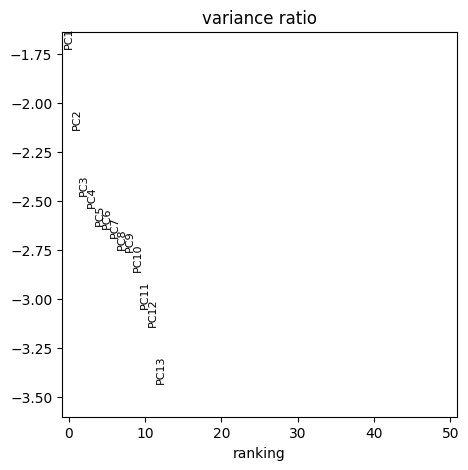

In [150]:
sc.pl.pca_variance_ratio(adata_reg, log=True, n_pcs = 50) #ndim = 10

In [166]:
sc.pp.neighbors(adata_reg, n_pcs=10)
sc.tl.umap(adata_reg)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


In [152]:
# Enlève les (+) dans les noms des gènes
liste = [i[:-3] for i in adata_reg.var_names]
print(liste)

adata_reg.var_names = liste

['Acaa1b', 'Bhlhe40', 'Elf3', 'Fosb', 'Fosl2', 'Mafb', 'Mxd1', 'Mxd4', 'Rbpj', 'Runx1', 'Spib', 'Stat1', 'Zfp12', 'Zfp710']


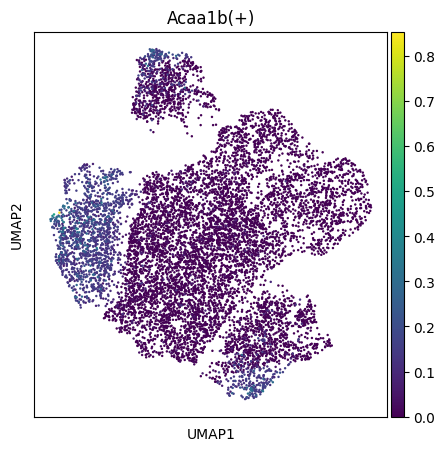

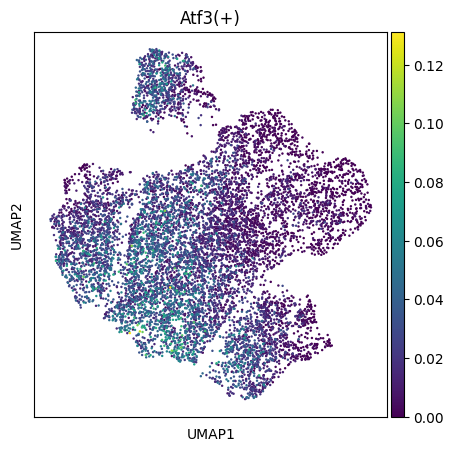

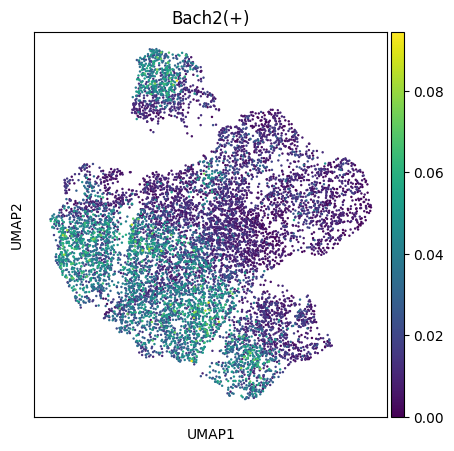

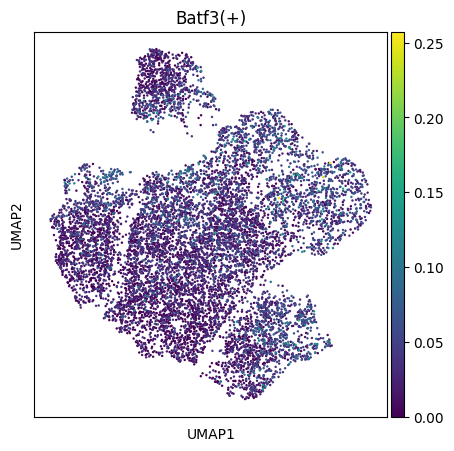

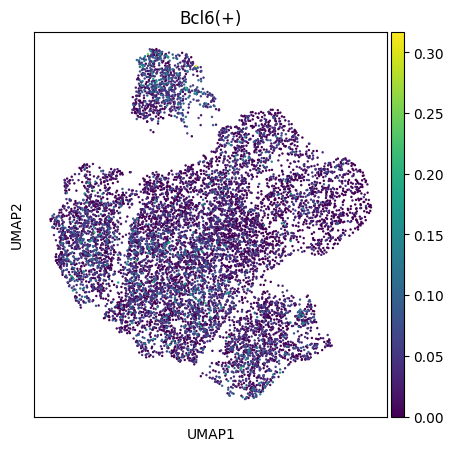

...

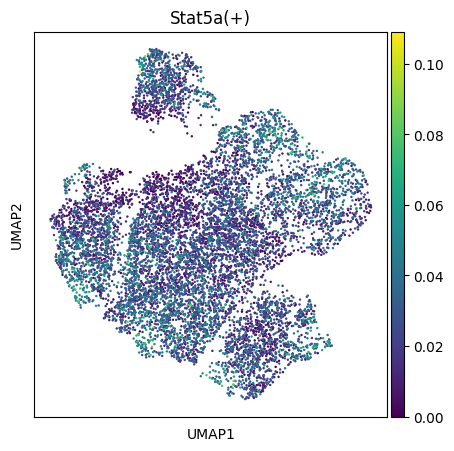

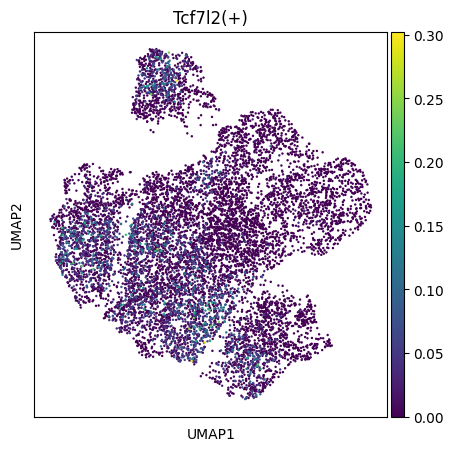

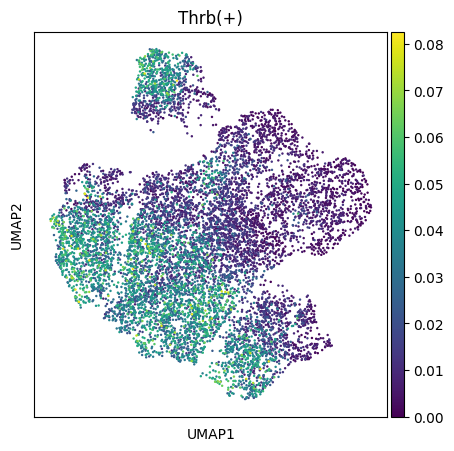

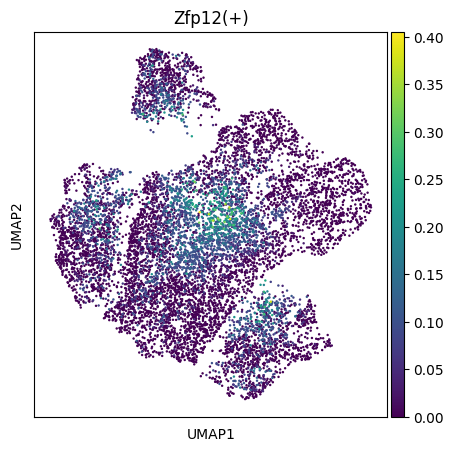

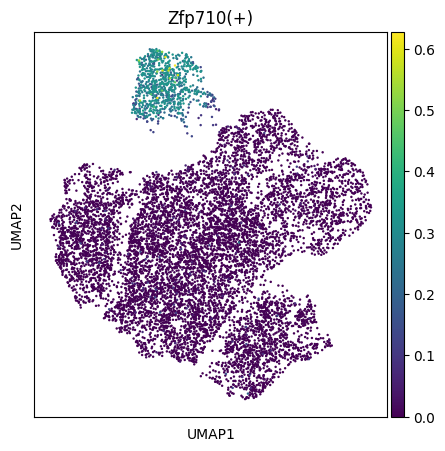

In [108]:
for i in adata_reg.obs.columns[16:]:
    sc.pl.umap(adata_reg, color = i)

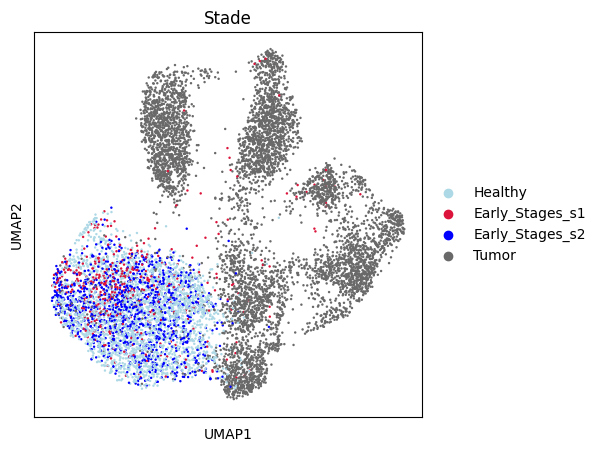

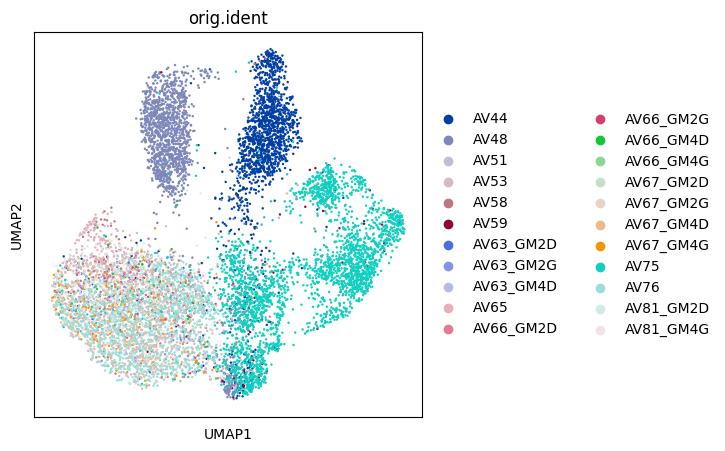

In [216]:
stade_colors = {"Healthy" : "lightblue", "Early_Stages_s1" : "crimson", "Early_Stages_s2" : "blue", "Tumor" : "dimgray"}
sc.pl.umap(adata_reg, color = "Stade", palette = stade_colors)
sc.pl.umap(adata_reg, color = "orig.ident")

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.986857   0.98206526 0.9730346  0.96724564 0.9645393
     0.9571072  0.9520831  0.9505514  0.9487338  0.94736916 0.9430607
     0.93902177 0.9346644  0.93122345]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


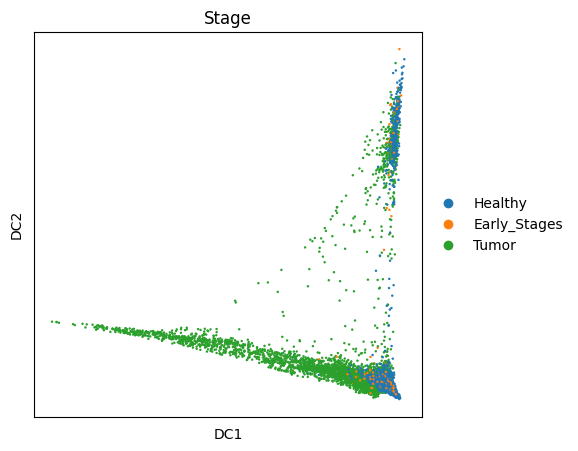

In [174]:
sc.tl.diffmap(adata_reg)
adata_reg.obsm["X_diffmap"] = adata_reg.obsm["X_diffmap"][:, 1:]
sc.pl.diffmap(adata_reg, color = "Stage")

In [201]:
# Tester avec raw data et --mask-droupout = False et aucell_threshold = 0.5

In [223]:
df = pd.read_csv("../data/SCENIC/pyscenic_output_raw.csv", index_col = 0)
df

,Ahr(+),Alx3(+),Atf2(+),Atf3(+),Atf4(+),Atf5(+),Atf7(+),Bach1(+),Bach2(+),Barx2(+),...,Zbtb20(+),Zbtb7a(+),Zbtb7c(+),Zfp148(+),Zfp407(+),Zfp704(+),Zfp740(+),Zfx(+),Zxdb(+),Zxdc(+)
Cell,,,,,,,,,,,,,,,,,,,,,
AAACGCTCAACCACAT-1_1,0.285900,0.190199,0.294374,0.370367,0.450814,0.140623,0.282473,0.385599,0.267066,0.149304,...,0.298503,0.304384,0.241501,0.348965,0.289316,0.305428,0.213994,0.264229,0.325689,0.136184
AAAGTGAGTGAATAAC-1_1,0.387456,0.058876,0.421843,0.562172,0.706417,0.180412,0.451449,0.650551,0.411699,0.272896,...,0.454776,0.457114,0.366802,0.552861,0.417034,0.473313,0.318407,0.454142,0.362978,0.000000
AACAAAGCATAGATGA-1_1,0.342312,0.131799,0.308654,0.471349,0.556713,0.100246,0.366242,0.492380,0.323025,0.362271,...,0.369672,0.356951,0.283675,0.418302,0.318832,0.402299,0.236206,0.350548,0.272917,0.070957
AACCAACGTGGGAGAG-1_1,0.360058,0.136112,0.390585,0.445341,0.570960,0.103394,0.373973,0.531240,0.317642,0.121793,...,0.370317,0.411669,0.316797,0.443404,0.341640,0.381534,0.240881,0.346456,0.361915,0.075317
AACTTCTTCCAGCAAT-1_1,0.449314,0.029757,0.491215,0.542799,0.697031,0.261829,0.487410,0.658473,0.455701,0.250437,...,0.489601,0.443285,0.395011,0.597823,0.477100,0.505103,0.368645,0.512613,0.312098,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45p_GM4D_GTAGATCAGCTGAAAT-1,0.388434,0.139845,0.378500,0.507731,0.508785,0.105760,0.474984,0.413700,0.465816,0.245112,...,0.459461,0.402156,0.347883,0.424776,0.426456,0.467958,0.270974,0.387929,0.264693,0.080655
45p_GM4D_TAGGTACAGCAGGCTA-1,0.429333,0.155142,0.368152,0.577847,0.482487,0.344341,0.503697,0.412214,0.504427,0.470528,...,0.498103,0.459830,0.371385,0.449356,0.457605,0.525559,0.277769,0.416051,0.265655,0.098663
45p_GM4D_TCTACATGTCTATGAC-1,0.432867,0.183705,0.307451,0.495937,0.426388,0.136145,0.391584,0.310305,0.399301,0.326588,...,0.394117,0.352408,0.280924,0.340934,0.355206,0.425971,0.296201,0.334277,0.335845,0.129732


In [204]:
liste_err = [i for i in df.index if i not in adata_epi.obs.index]
len(liste_err)


0

In [205]:
for column in df.columns:
    adata_epi.obs[column] = df[column]

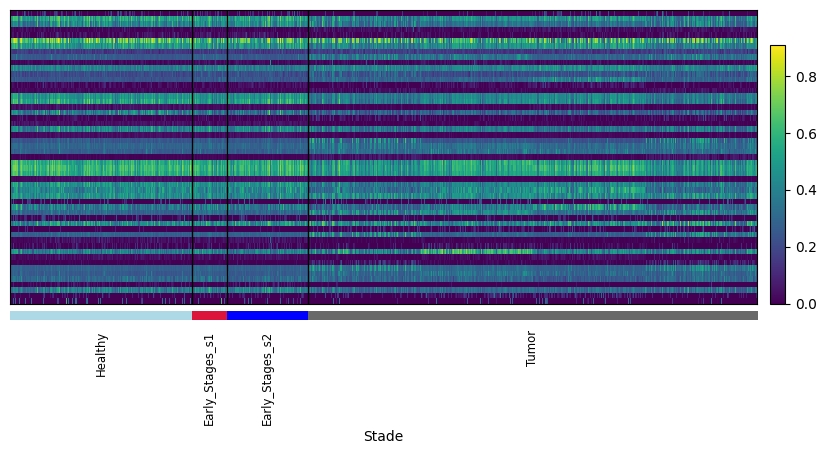

In [206]:
sc.pl.heatmap(adata_epi, groupby = "Stade", var_names=columns, swap_axes=True)

In [207]:
adata_reg = anndata.AnnData(df, obs = adata_epi.obs)

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=45
    finished (0:00:00)


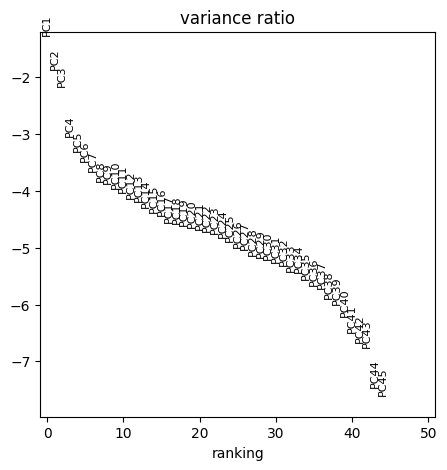

In [208]:
adata_reg = sf.pp_PCA(adata_reg) # Function defined in scFunctions.py

# Normalize, Log-transform, select HVG, scale data and perform PCA

sc.pl.pca_variance_ratio(adata_reg, log=True, n_pcs = 50) #ndim = 30

In [209]:
sc.pp.neighbors(adata_reg, n_pcs=30)
sc.tl.umap(adata_reg)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


In [210]:
# Enlève les (+) dans les noms des gènes
liste = [i[:-3] for i in adata_reg.var_names]
print(liste)

adata_reg.var_names = liste

['Alx3', 'Atf5', 'Bach2', 'Barx2', 'Bptf', 'Brca1', 'Cbfb', 'Churc1', 'E2f1', 'Elf3', 'Ep300', 'Ets1', 'Etv2', 'Fosb', 'Fosl2', 'Foxc1', 'Foxk2', 'Gata3', 'Gcm2', 'Hivep2', 'Hmg20b', 'Hoxa5', 'Ilf2', 'Irf6', 'Klf3', 'Mafb', 'Mafg', 'Mxd4', 'Mxi1', 'Mybl2', 'Myod1', 'Nfe2l2', 'Pax3', 'Pdlim5', 'Relb', 'Rreb1', 'Runx3', 'Smc3', 'Sox10', 'Sox4', 'Srebf1', 'Tfap2c', 'Tfe3', 'Ybx1', 'Zbtb18', 'Zxdc']


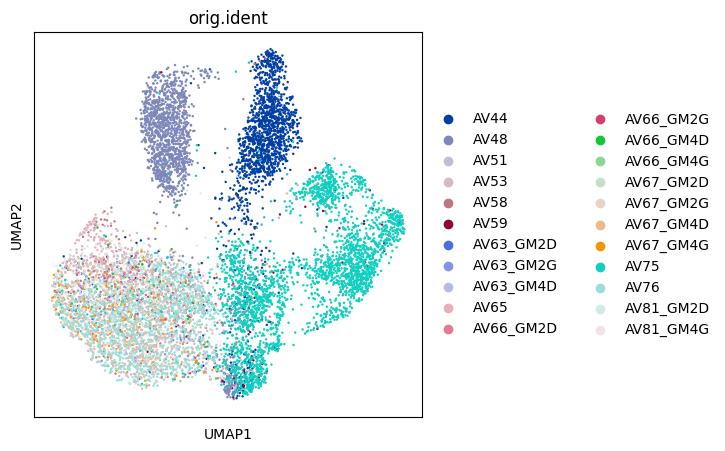

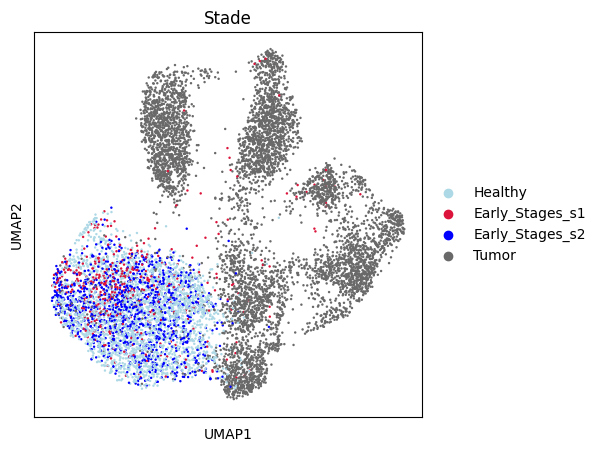

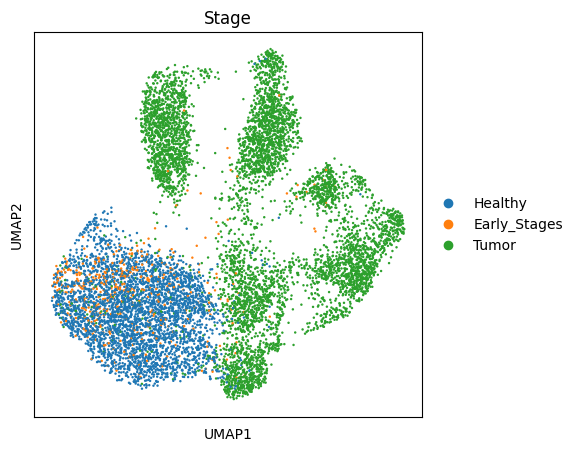

In [218]:
sc.pl.umap(adata_reg, color = "orig.ident")
sc.pl.umap(adata_reg, color = "Stade", palette = stade_colors)
sc.pl.umap(adata_reg, color = "Stage")

In [202]:
# Si ça marche toujours pas, essayer le tutoriel en python en changeant les versions des packages qui bug

In [222]:
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize

In [228]:
rss_cellType = regulon_specificity_scores(df, adata_epi.obs['cnv_group'] )
rss_cellType

AttributeError: module 'numpy' has no attribute 'float'.
`np.float` was a deprecated alias for the builtin `float`. To avoid this error in existing code, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations